<a href="https://colab.research.google.com/github/nthlyyy/DataScienceProject/blob/main/DeepLearning_FaceMaskDetection_RocelleNathalieOng.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Exam/ Project: Face Mask Detection by applying Deep Learning to prevent Covid-19 transmission

####By: Rocelle Nathalie Ong

## Requirements
1. Discuss the problem and the objective. 
2. Describe the dataset used to solve the problem.
3. Use Deep Learning algorithm to solve the problem.
4. Present your result using data visualization 
5. Evaluate the result of your model.
6. Write your conclusion and reflection.
7. Submit the google colab file of your final project

##Introduction

As of this year 2021, we are facing a surge of covid cases due to the new variant, the Delta or B.1.617.2. According to Center of Disease Control and Prevention or CDC, the Delta variant is more infectious and contagious that leads to increase transmissibility as compared with other variants. Patients infected with this variant are high risk to be hospitalized than patients infected with the other strains of COVID-19.

## Problem and Objectives

In order to prevent and lessen the transmission of delta variant, we are required by the World Health Organization (WHO) and Department of Health (DOH) to wear mask and maintain a 6 feet distancing.

As delta variant spread rapidly, we need to limit the number of people on a certain area. Instead of assigning multiple personnel, the best solution is to apply automated technology that can detect if a person is wearing a face mask. 

Due to this problem, the main objective of this project is to develop an object detection model that can able to predict whether a person is wearing a face mask or not and if the mask is not worn properly. In this way we can able to lessen the spread of the virus by immediate identification of the people not wearing their masks and by limiting the number of people present in an area.

Other objectives are:

1. To apply deep learning concepts in creating the object detection model
2. To build and train the model
3. To evaluate the performance of the model
4. To test the model by using unseen images and video

## Dataset

The dataset used in this project composed of 853 images of people wearing and not waering a facemask. The data are retrieved at Kaggle and uploaded at Roboflow to apply respective annotations of each images. 

The following are the classes present in the dataset: 'with_mask', 'without_mask', and 'mask_weared_incorrect'


### Build the model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 9762, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 9762 (delta 12), reused 13 (delta 7), pack-reused 9739
Receiving objects: 100% (9762/9762), 10.04 MiB | 31.44 MiB/s, done.
Resolving deltas: 100% (6786/6786), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
!pip install -qr requirements.txt 
import torch

from IPython.display import Image, clear_output  
from utils.google_utils import gdrive_download 

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 636 kB 5.1 MB/s 
Setup complete. Using torch 1.9.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [ ]:
%cd /content
!curl -L "https://app.roboflow.com/ds/9azU04qdfy?key=9IKh2mLjYW" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1132      0 --:--:-- --:--:-- --:--:--  1131
100 21.1M  100 21.1M    0     0  17.6M      0  0:00:01  0:00:01 --:--:-- 17.6M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/maksssksksss124_png.rf.d556f9ed5407e0c92cd2f8e8c83d285a.jpg  
 extracting: test/images/maksssksksss132_png.rf.db3fc01ae361efdd572c7578f7629cd9.jpg  
 extracting: test/images/maksssksksss136_png.rf.6ce8f819659ea30b31c0d81eec52f143.jpg  
 extracting: test/images/maksssksksss15_png.rf.c9ca2eec14b596b0dd634c9ef75482a3.jpg  
 extracting: test/images/maksssksksss165_png.rf.85a0ebbf908774f723a4e69135ca3350.jpg  
 extracting: test/images/maksssksksss169_png.rf.1a5286bb8e1

In [ ]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['mask_weared_incorrect', 'with_mask', 'without_mask']

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 500 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 582 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', entity=None, epochs=500, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results2', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tens

## Evaluation of the model

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 327), started 0:57:28 ago. (Use '!kill 327' to kill it.)

<IPython.core.display.Javascript object>

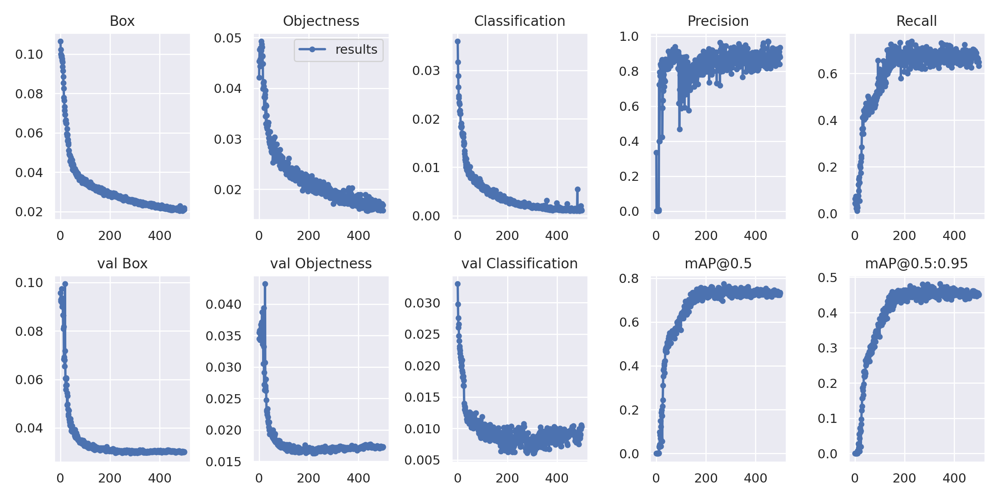

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results2/results.png', width=1000)  # view results.png

The performance metric of the model is shown above by using TensorBoard and image. The following are the points about the performance of the model:
1. At 500 epochs the train loss are around 0.02, 2e-3 and 0.016 for Box, Objectness and Classification loss, respectively.
2. At 500 epochs the validation loss are around 0.02, 0.015 and 0.010 for Box, Objectness and Classification loss, respectively.
3. As the epochs increases the graph becomes closer to zero. This means that the model is unbiased

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 200 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=200, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
image 1/85 /content/yolov5/../test/images/maksssksksss124_png.rf.d556f9ed5407e0c92cd2f8e8c8

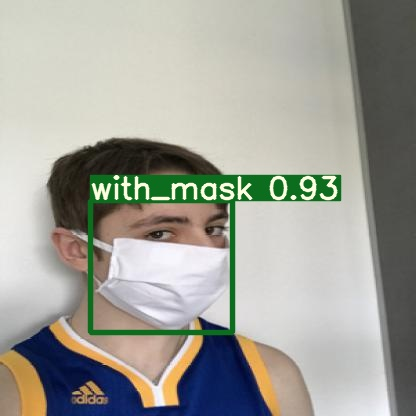

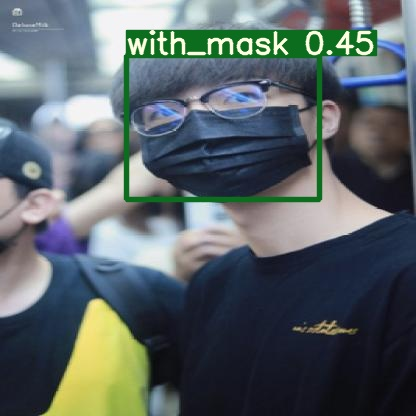

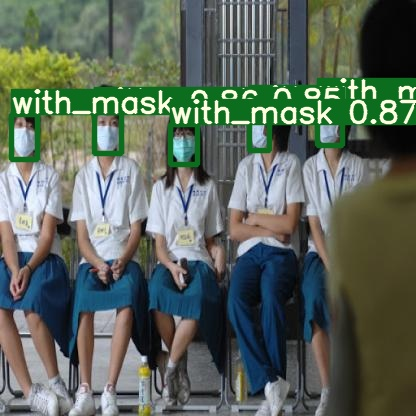

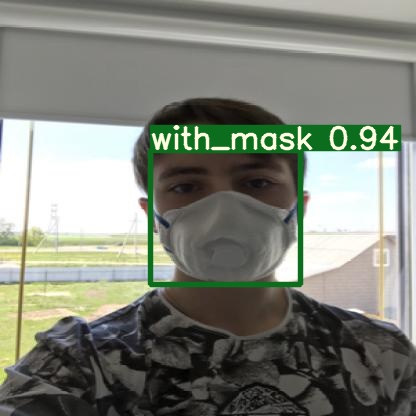

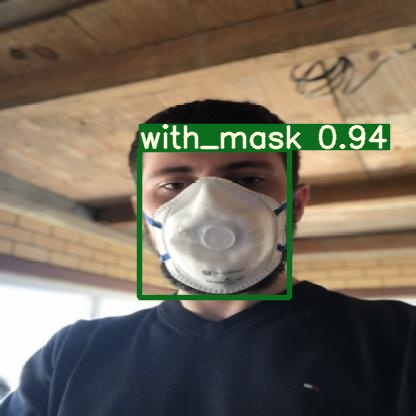

...

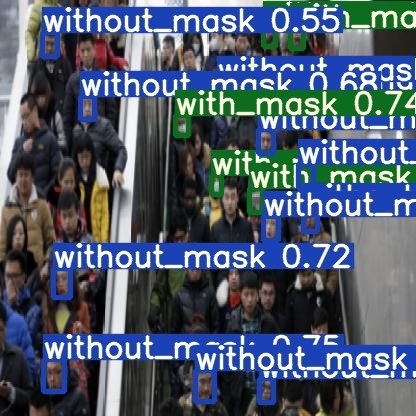

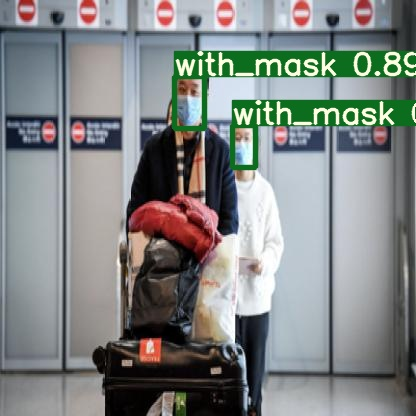

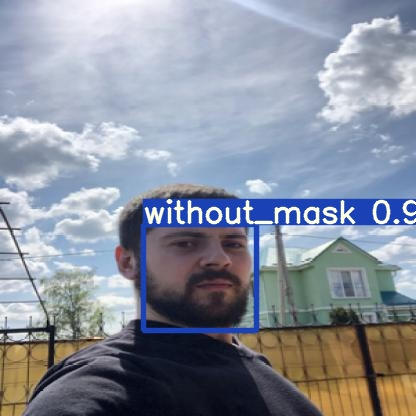

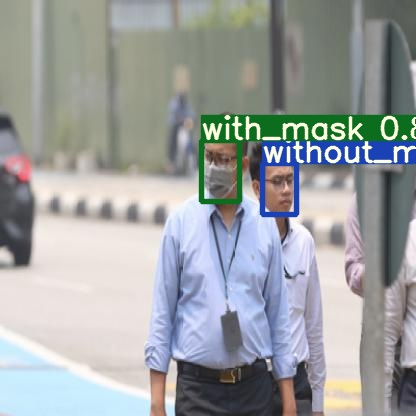

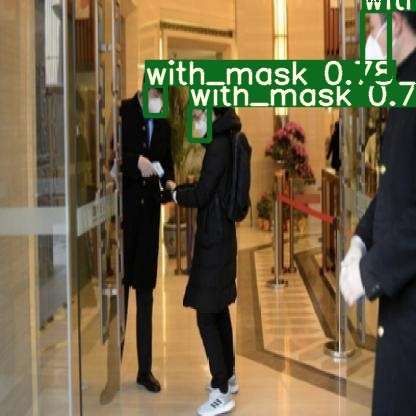

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
import glob
from IPython.display import Image, display
%%time
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 200 --conf 0.75 --source img1.jpg


/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.75, device='', exist_ok=False, img_size=200, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='img1.jpg', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
image 1/1 /content/yolov5/img1.jpg: 224x128 1 mask_weared_incorrect, Done. (0.011s)
Results save

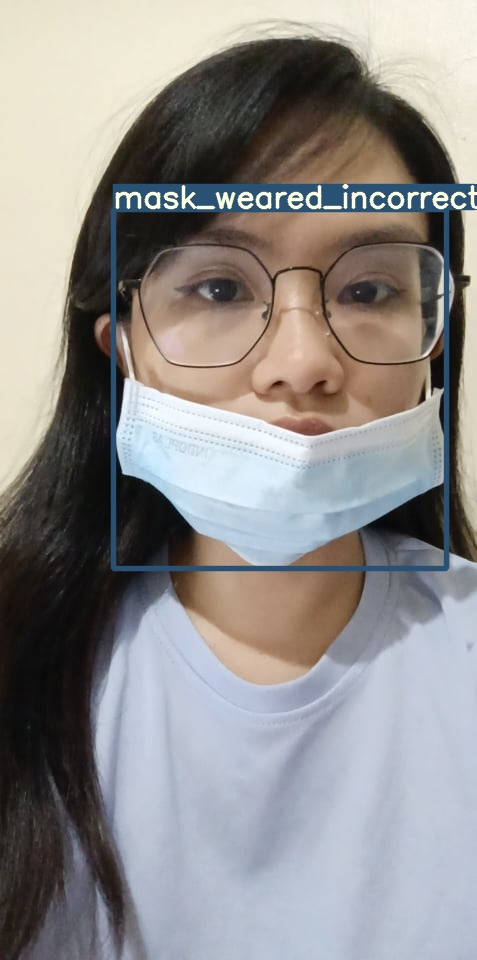

In [ ]:

for imageName in glob.glob('/content/yolov5/runs/detect/exp10/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 200 --conf 0.8 --source test_video.mp4

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.8, device='', exist_ok=False, img_size=200, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='test_video.mp4', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
video 1/1 (1/677) /content/yolov5/test_video.mp4: 128x224 1 without_mask, Done. (0.014s)
vi

Testing the trained model using an unseen images and video. (Please see attached video for the result). The model was able to detect correctly if the person is wearing a face mask or not and if the model was worn correctly. The accuracy prediction of all the classes has a value ranging from 80-90%

## Conclusion and Reflection

**Conclusion**

Since there is a surge of covid infections due to the new covid variant, we must strictly follow our health guidelines imposed by our Department of Health. As technology is advanced nowadays, we need to automate that can help public in detecting if the person is wearing, not wearing or improperly wearing a mask. In this way, we avoid transmission and at the same time limit the number of people present in an area. The best technology to use was face mask detection is by using deep learning algorithms.

Based on the project done, the following were done in order to create a model with good predicting capability:

1. Dataset must undergo preprocessing techniques.
2. Correctly annotate the object in an images
3. Split the dataset into train, test and validation for training and evaluating the model
4. Using YoloV5 pretrained model
5. Evaluating the model by checking the train and validation loss, and the behavior of the curve
6. Test the prediction capability of the model by using new data and observe the pediction accuracy

By applying all these techniques, the model can able to predict all the classes having an accuracy of 80-90% and loss less than 0.02

**Reflection**

I chose the topic "Face mask detection using deep learning to prevent Covid 19 transmission" which is similar with my previous project in our Advanced Data Science subject. I wanted to improve what I've done before from doing image classfication using CNN into creating object detection model using Yolo V5 algorithm. Aside from this, I wanted to apply what I have learned in this course
with our major problem, the covid 19 pandemic.

In this final project, I learned that in order to have a object detection model with good performance, it is really important to preprocess the dataset first and avoiding the data to become imbalance. 

Second is to modify the parameters of the model in order to improve its detection accuracy.

Lastly, it is really important the evaluation of the model does not end on using the validation dataset. we must also test the model if it can predict or perform well with unseen data.